<a href="https://colab.research.google.com/github/lucvseco/ripe-strawberries-detection/blob/main/ripe_strawberries_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BIBLIOTECAS E IMPORTS

In [ ]:
%%capture
!pip install super-gradients
!pip install --upgrade pillow
!pip install --upgrade torchvision

In [ ]:
import pandas as pd
import numpy as np
import os
import glob
import xml.etree.ElementTree as ET
import random
import shutil
import random
import torch
from google.colab import drive
import requests
from PIL import Image
from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training.models.detection_models.pp_yolo_e import (
    PPYoloEPostPredictionCallback
)
import cv2

The console stream is logged into /root/sg_logs/console.log


[2024-03-29 16:39:45] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-03-29 16:39:46] WARNING - __init__.py - Failed to import pytorch_quantization
[2024-03-29 16:39:58] WARNING - calibrator.py - Failed to import pytorch_quantization
[2024-03-29 16:39:58] WARNING - export.py - Failed to import pytorch_quantization
[2024-03-29 16:39:58] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2024-03-29 16:39:58] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2024-03-29 16:39:58] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2024-03-29 16:39:58] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2024-03-29 16:39:58] WARNING - env_sanity_check.py - Failed to verify installed packages: sphinx-rtd-theme required but not fo

# TRATANDO O XML

In [ ]:
path = '/content/annotations.xml'

In [ ]:
path = '/content/annotations.xml'
dataset = []

for anno in glob.glob(path):
    tree = ET.parse(anno)
    root = tree.getroot()

    for image_elem in root.iter("image"):
        image_attrs = image_elem.attrib
        image_data = {
            "filename": image_attrs['name'],
            "width": float(image_attrs['width']),
            "height": float(image_attrs['height']),
            "boxes": []
        }

        for box_elem in image_elem.iter("box"):
            box_attrs = box_elem.attrib
            box_data = {
                "label": box_attrs['label'],
                "occluded": int(box_attrs['occluded']),
                "xtl": float(box_attrs['xtl']),
                "ytl": float(box_attrs['ytl']),
                "xbr": float(box_attrs['xbr']),
                "ybr": float(box_attrs['ybr'])
            }
            image_data["boxes"].append(box_data)

        dataset.append(image_data)

In [ ]:
data0=pd.DataFrame(dataset)
display(data0)

,filename,width,height,boxes
0,images/0.png,1200.0,800.0,"[{'label': 'strawberry', 'occluded': 0, 'xtl':..."
1,images/1.png,1600.0,900.0,"[{'label': 'strawberry', 'occluded': 1, 'xtl':..."
2,images/10.png,920.0,425.0,"[{'label': 'strawberry', 'occluded': 1, 'xtl':..."
3,images/11.png,640.0,480.0,"[{'label': 'strawberry', 'occluded': 0, 'xtl':..."
4,images/12.png,1920.0,1080.0,"[{'label': 'strawberry', 'occluded': 0, 'xtl':..."
5,images/13.png,807.0,607.0,"[{'label': 'strawberry', 'occluded': 1, 'xtl':..."
6,images/14.png,2592.0,1936.0,"[{'label': 'strawberry', 'occluded': 1, 'xtl':..."
7,images/15.png,1294.0,970.0,"[{'label': 'strawberry', 'occluded': 0, 'xtl':..."
8,images/16.png,2368.0,1624.0,"[{'label': 'strawberry', 'occluded': 1, 'xtl':..."
9,images/17.png,1000.0,810.0,"[{'label': 'strawberry', 'occluded': 0, 'xtl':..."


In [ ]:
data2=pd.DataFrame()
for i in range(len(data0)):
    boxes=data0.loc[i,'boxes']
    for box in boxes:
        a=data0.loc[i,'filename']
        b=data0.loc[i,'width']
        c=data0.loc[i,'height']
        d=box['xtl']
        e=box['ytl']
        f=box['xbr']
        g=box['ybr']
        add_df=pd.DataFrame([[a,b,c,d,e,f,g]])
        data2=pd.concat([data2,add_df],axis=0)
data2.columns=['filename','width','height','xtl','ytl','xbr','ybr']
display(data2)

,filename,width,height,xtl,ytl,xbr,ybr
0,images/0.png,1200.0,800.0,368.18,292.79,460.65,454.46
0,images/0.png,1200.0,800.0,423.70,268.56,537.50,471.16
0,images/0.png,1200.0,800.0,538.93,338.40,666.51,509.38
0,images/0.png,1200.0,800.0,642.29,416.47,789.86,616.35
0,images/0.png,1200.0,800.0,734.64,416.40,837.78,597.06
...,...,...,...,...,...,...,...
0,images/9.png,1600.0,1200.0,1208.45,713.03,1386.04,922.00
0,images/9.png,1600.0,1200.0,126.12,207.98,277.09,431.25
0,images/9.png,1600.0,1200.0,136.68,555.56,416.67,900.57
0,images/9.png,1600.0,1200.0,261.24,523.59,490.52,805.78


In [ ]:
data2['label']=0
data2['Xcent']=(data2['xtl']+data2['xbr'])/(2*data2['width'])
data2['Ycent']=(data2['ytl']+data2['ybr'])/(2*data2['height'])
data2['boxW']=(data2['xbr']-data2['xtl'])/data2['width']
data2['boxH']=(data2['ybr']-data2['ytl'])/data2['height']

In [ ]:
display(data2)
data2.to_csv('annotation.csv',index=False)

,filename,width,height,xtl,ytl,xbr,ybr,label,Xcent,Ycent,boxW,boxH
0,images/0.png,1200.0,800.0,368.18,292.79,460.65,454.46,0,0.345346,0.467031,0.077058,0.202087
0,images/0.png,1200.0,800.0,423.70,268.56,537.50,471.16,0,0.400500,0.462325,0.094833,0.253250
0,images/0.png,1200.0,800.0,538.93,338.40,666.51,509.38,0,0.502267,0.529863,0.106317,0.213725
0,images/0.png,1200.0,800.0,642.29,416.47,789.86,616.35,0,0.596729,0.645513,0.122975,0.249850
0,images/0.png,1200.0,800.0,734.64,416.40,837.78,597.06,0,0.655175,0.633412,0.085950,0.225825
...,...,...,...,...,...,...,...,...,...,...,...,...
0,images/9.png,1600.0,1200.0,1208.45,713.03,1386.04,922.00,0,0.810778,0.681262,0.110994,0.174142
0,images/9.png,1600.0,1200.0,126.12,207.98,277.09,431.25,0,0.126003,0.266346,0.094356,0.186058
0,images/9.png,1600.0,1200.0,136.68,555.56,416.67,900.57,0,0.172922,0.606721,0.174994,0.287508
0,images/9.png,1600.0,1200.0,261.24,523.59,490.52,805.78,0,0.234925,0.553904,0.143300,0.235158


# CRIANDO OS DIRETÓRIOS PARA ARMAZENAR AS IMAGENS E LABELS

In [ ]:
!mkdir labels

In [ ]:
files=data2['filename'].unique().tolist()
for file in files:
    datai=data2[data2['filename']==file].iloc[:,7:]
    name=file.split('/')[-1][0:-4]
    fmt = ['%d'] + ['%f'] * (datai.shape[1]-1)
    np.savetxt("labels/"+name+".txt", np.array(datai), fmt=fmt, delimiter="\t")

In [ ]:
drive.mount('/content/drive')

path0 = '/content/drive/MyDrive/images'
path0l = '/content/drive/MyDrive/labels'
path1a = '/content/drive/MyDrive/datasets/train/images'
path1b = '/content/drive/MyDrive/datasets/valid/images'
path1c = '/content/drive/MyDrive/datasets/test/images'
path1al = '/content/drive/MyDrive/datasets/train/labels'
path1bl = '/content/drive/MyDrive/datasets/valid/labels'
path1cl = '/content/drive/MyDrive/datasets/test/labels'


paths = [path0, path0l, path1a, path1b, path1c, path1al, path1bl, path1cl]

In [ ]:
# Criação dos diretórios
for path in paths:
    os.makedirs(path, exist_ok=True)
    print(f'Diretório criado: {path}')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Diretório criado: /content/drive/MyDrive/images
Diretório criado: /content/drive/MyDrive/labels
Diretório criado: /content/drive/MyDrive/datasets/train/images
Diretório criado: /content/drive/MyDrive/datasets/valid/images
Diretório criado: /content/drive/MyDrive/datasets/test/images
Diretório criado: /content/drive/MyDrive/datasets/train/labels
Diretório criado: /content/drive/MyDrive/datasets/valid/labels
Diretório criado: /content/drive/MyDrive/datasets/test/labels


In [ ]:
paths0=[]
for dirname, _, filenames in os.walk(path0):
    for filename in filenames:
        paths0+=[(os.path.join(dirname, filename))]
paths0=random.sample(paths0,len(paths0))
print(paths0[0:5])

['/content/drive/MyDrive/images/25.png', '/content/drive/MyDrive/images/13.png', '/content/drive/MyDrive/images/20.png', '/content/drive/MyDrive/images/19.png', '/content/drive/MyDrive/images/12.png']


In [ ]:
!mkdir datasets
!mkdir datasets/train
!mkdir datasets/valid
!mkdir datasets/test
!mkdir {path1a}
!mkdir {path1b}
!mkdir {path1c}
!mkdir {path1al}
!mkdir {path1bl}
!mkdir {path1cl}

mkdir: cannot create directory ‘/content/drive/MyDrive/datasets/train/images’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/datasets/valid/images’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/datasets/test/images’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/datasets/train/labels’: File exists


In [ ]:
for i,path in enumerate(paths0):
    if i<25:
        !cp -r {path} {path1a}
        file=path.split('/')[-1][0:-4]+'.txt'
        path2=os.path.join(path0l,file)
        !cp -r {path2} {path1al}
    elif i<35:
        !cp -r {path} {path1b}
        file=path.split('/')[-1][0:-4]+'.txt'
        path2=os.path.join(path0l,file)
        !cp -r {path2} {path1bl}
    else:
        !cp -r {path} {path1c}
        file=path.split('/')[-1][0:-4]+'.txt'
        path2=os.path.join(path0l,file)
        !cp -r {path2} {path1cl}

# CRINDO A CLASSE CONFIG

In [ ]:
class Config:
    def __init__(self):
        self.checkpoint_dir = '/content/drive/MyDrive/checkpoints'
        self.experiment_name = '/content/drive/MyDrive/experiment_name'
        self.data_dir = '/content/drive/MyDrive/datasets'

        self.dirs = self.setup_data_dirs(['train', 'valid', 'test'])

        self.classes = ['strawberry']
        self.num_classes = len(self.classes)

        self.dataloader_params = {
            'batch_size': 4,
            'num_workers': 2
        }

        self.model_params = self.setup_model_params('yolo_nas_l', 'coco')

    def setup_data_dirs(self, phases):
        dirs = {}
        for phase in phases:
            image_dir = f"{self.data_dir}/{phase}/images"
            label_dir = f"{self.data_dir}/{phase}/labels"
            dirs[f"{phase}_images_dir"] = image_dir
            dirs[f"{phase}_labels_dir"] = label_dir
        return dirs

    def setup_model_params(self, model_name, pretrained_weights):
        return {
            'model_name': model_name,
            'pretrained_weights': pretrained_weights
        }

config = Config()

print(f"Checkpoint Dir: {config.checkpoint_dir}")
print(f"Experiment Name: {config.experiment_name}")
print(f"Training Images Directory: {config.dirs['train_images_dir']}")
print(f"Model Name: {config.model_params['model_name']}")


In [ ]:
trainer = Trainer(experiment_name=config.experiment_name,
                  ckpt_root_dir=config.checkpoint_dir)

# COCO no YOLO

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': config.data_dir,
        'images_dir': config.dirs['train_images_dir'],
        'labels_dir': config.dirs['train_labels_dir'],
        'classes': config.classes
    },
    dataloader_params=config.dataloader_params
)

# Corrige as chaves para corresponder àquelas definidas na classe Config
val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.data_dir,
        'images_dir': config.dirs['valid_images_dir'],  # Corrigido de val_images_dir para valid_images_dir
        'labels_dir': config.dirs['valid_labels_dir'],  # Corrigido de val_labels_dir para valid_labels_dir
        'classes': config.classes
    },
    dataloader_params=config.dataloader_params
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.data_dir,
        'images_dir': config.dirs['test_images_dir'],
        'labels_dir': config.dirs['test_labels_dir'],
        'classes': config.classes
    },
    dataloader_params=config.dataloader_params
)

[2024-03-29 16:53:08] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]
[2024-03-29 16:53:26] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]
[2024-03-29 16:53:33] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 5/5 [00:02<00:00,  1.82it/s]


In [ ]:
# Acessando os parâmetros do modelo a partir do dicionário model_params no objeto config
model = models.get(config.model_params['model_name'],
                   num_classes=config.num_classes,
                   pretrained_weights=config.model_params['pretrained_weights']
                  )

[2024-03-29 16:53:59] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-03-29 16:53:59] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:01<00:00, 176MB/s]
[2024-03-29 16:54:01] INFO - checkpoint

# ARQUITETURA / TREINAMENTO / PREDIÇÃO

In [ ]:
train_params = {
    "average_best_models": True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "AdamW",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 30,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=config.num_classes,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=config.num_classes,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

[2024-03-29 16:54:09] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240329_165409_922476`
[2024-03-29 16:54:09] INFO - sg_trainer.py - Checkpoints directory: /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476
[2024-03-29 16:54:09] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/console_Mar29_16_54_09.txt


/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:108: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
  warnings.warn(
[2024-03-29 16:54:17] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.0905
│   ├── Ppyoloeloss/loss_iou = 0.8142
│   ├── Ppyoloeloss/loss_dfl = 0.7919
│   └── Ppyoloeloss/loss = 3.6966
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.1008
    ├── Ppyoloeloss/loss_iou = 0.6923
    ├── Ppyoloeloss/loss_dfl = 0.7748
    ├── Ppyoloeloss/loss = 3.568
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0043
    ├── F1@0.50 = 0.0
    └── Best_score_threshold = 0.0



Validating epoch 1: 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]
[2024-03-29 16:55:04] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 16:55:04] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.36137300729751587


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.7466
│   │   ├── Epoch N-1      = 2.0905 (↘ -0.3439)
│   │   └── Best until now = 2.0905 (↘ -0.3439)
│   ├── Ppyoloeloss/loss_iou = 0.6997
│   │   ├── Epoch N-1      = 0.8142 (↘ -0.1146)
│   │   └── Best until now = 0.8142 (↘ -0.1146)
│   ├── Ppyoloeloss/loss_dfl = 0.664
│   │   ├── Epoch N-1      = 0.7919 (↘ -0.1279)
│   │   └── Best until now = 0.7919 (↘ -0.1279)
│   └── Ppyoloeloss/loss = 3.1103
│       ├── Epoch N-1      = 3.6966 (↘ -0.5863)
│       └── Best until now = 3.6966 (↘ -0.5863)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1047
    │   ├── Epoch N-1      = 2.1008 (↘ -0.9961)
    │   └── Best until now = 2.1008 (↘ -0.9961)
    ├── Ppyoloeloss/loss_iou = 0.601
    │   ├── Epoch N-1      = 0.6923 (↘ -0.0913)
    │   └── Best until now = 0.6923 (↘ -0.0913)
    ├── Ppyoloeloss/loss_dfl = 0.6525
    │   ├── Epoch N-1      = 0.7748 (↘ -0.1223)
    │   └── Best until now = 0.7748 (↘ -0.1223)
    ├── Ppyoloeloss/loss

Validating epoch 2: 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]
[2024-03-29 16:55:28] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 16:55:28] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6676573753356934


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0943
│   │   ├── Epoch N-1      = 1.7466 (↘ -0.6524)
│   │   └── Best until now = 1.7466 (↘ -0.6524)
│   ├── Ppyoloeloss/loss_iou = 0.6602
│   │   ├── Epoch N-1      = 0.6997 (↘ -0.0394)
│   │   └── Best until now = 0.6997 (↘ -0.0394)
│   ├── Ppyoloeloss/loss_dfl = 0.6394
│   │   ├── Epoch N-1      = 0.664  (↘ -0.0246)
│   │   └── Best until now = 0.664  (↘ -0.0246)
│   └── Ppyoloeloss/loss = 2.3939
│       ├── Epoch N-1      = 3.1103 (↘ -0.7164)
│       └── Best until now = 3.1103 (↘ -0.7164)
└── Validation
    ├── Ppyoloeloss/loss_cls = 44.4394
    │   ├── Epoch N-1      = 1.1047 (↗ 43.3347)
    │   └── Best until now = 1.1047 (↗ 43.3347)
    ├── Ppyoloeloss/loss_iou = 0.6207
    │   ├── Epoch N-1      = 0.601  (↗ 0.0197)
    │   └── Best until now = 0.601  (↗ 0.0197)
    ├── Ppyoloeloss/loss_dfl = 0.6682
    │   ├── Epoch N-1      = 0.6525 (↗ 0.0156)
    │   └── Best until now = 0.6525 (↗ 0.0156)
    ├── Ppyoloeloss/loss 

Validating epoch 3: 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.942
│   │   ├── Epoch N-1      = 1.0943 (↘ -0.1522)
│   │   └── Best until now = 1.0943 (↘ -0.1522)
│   ├── Ppyoloeloss/loss_iou = 0.6511
│   │   ├── Epoch N-1      = 0.6602 (↘ -0.0092)
│   │   └── Best until now = 0.6602 (↘ -0.0092)
│   ├── Ppyoloeloss/loss_dfl = 0.6049
│   │   ├── Epoch N-1      = 0.6394 (↘ -0.0345)
│   │   └── Best until now = 0.6394 (↘ -0.0345)
│   └── Ppyoloeloss/loss = 2.1981
│       ├── Epoch N-1      = 2.3939 (↘ -0.1959)
│       └── Best until now = 2.3939 (↘ -0.1959)
└── Validation
    ├── Ppyoloeloss/loss_cls = 23.3622
    │   ├── Epoch N-1      = 44.4394 (↘ -21.0772)
    │   └── Best until now = 1.1047 (↗ 22.2575)
    ├── Ppyoloeloss/loss_iou = 0.6059
    │   ├── Epoch N-1      = 0.6207 (↘ -0.0148)
    │   └── Best until now = 0.601  (↗ 0.0049)
    ├── Ppyoloeloss/loss_dfl = 0.6866
    │   ├── Epoch N-1      = 0.6682 (↗ 0.0185)
    │   └── Best until now = 0.6525 (↗ 0.0341)
    ├── Ppyoloeloss/los

Validating epoch 4: 100%|██████████| 2/2 [00:01<00:00,  1.93it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9578
│   │   ├── Epoch N-1      = 0.942  (↗ 0.0158)
│   │   └── Best until now = 0.942  (↗ 0.0158)
│   ├── Ppyoloeloss/loss_iou = 0.643
│   │   ├── Epoch N-1      = 0.6511 (↘ -0.0081)
│   │   └── Best until now = 0.6511 (↘ -0.0081)
│   ├── Ppyoloeloss/loss_dfl = 0.6102
│   │   ├── Epoch N-1      = 0.6049 (↗ 0.0052)
│   │   └── Best until now = 0.6049 (↗ 0.0052)
│   └── Ppyoloeloss/loss = 2.211
│       ├── Epoch N-1      = 2.1981 (↗ 0.0129)
│       └── Best until now = 2.1981 (↗ 0.0129)
└── Validation
    ├── Ppyoloeloss/loss_cls = 23.4077
    │   ├── Epoch N-1      = 23.3622 (↗ 0.0454)
    │   └── Best until now = 1.1047 (↗ 22.3029)
    ├── Ppyoloeloss/loss_iou = 0.6036
    │   ├── Epoch N-1      = 0.6059 (↘ -0.0023)
    │   └── Best until now = 0.601  (↗ 0.0025)
    ├── Ppyoloeloss/loss_dfl = 0.7695
    │   ├── Epoch N-1      = 0.6866 (↗ 0.0828)
    │   └── Best until now = 0.6525 (↗ 0.1169)
    ├── Ppyoloeloss/loss = 24.78

Validating epoch 5: 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.956
│   │   ├── Epoch N-1      = 0.9578 (↘ -0.0018)
│   │   └── Best until now = 0.942  (↗ 0.0139)
│   ├── Ppyoloeloss/loss_iou = 0.6097
│   │   ├── Epoch N-1      = 0.643  (↘ -0.0333)
│   │   └── Best until now = 0.643  (↘ -0.0333)
│   ├── Ppyoloeloss/loss_dfl = 0.6138
│   │   ├── Epoch N-1      = 0.6102 (↗ 0.0036)
│   │   └── Best until now = 0.6049 (↗ 0.0089)
│   └── Ppyoloeloss/loss = 2.1795
│       ├── Epoch N-1      = 2.211  (↘ -0.0315)
│       └── Best until now = 2.1981 (↘ -0.0186)
└── Validation
    ├── Ppyoloeloss/loss_cls = 37.2416
    │   ├── Epoch N-1      = 23.4077 (↗ 13.8339)
    │   └── Best until now = 1.1047 (↗ 36.1369)
    ├── Ppyoloeloss/loss_iou = 0.5461
    │   ├── Epoch N-1      = 0.6036 (↘ -0.0574)
    │   └── Best until now = 0.601  (↘ -0.0549)
    ├── Ppyoloeloss/loss_dfl = 0.7504
    │   ├── Epoch N-1      = 0.7695 (↘ -0.0191)
    │   └── Best until now = 0.6525 (↗ 0.0979)
    ├── Ppyoloeloss/loss 

Validating epoch 6: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9423
│   │   ├── Epoch N-1      = 0.956  (↘ -0.0137)
│   │   └── Best until now = 0.942  (↗ 0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.5718
│   │   ├── Epoch N-1      = 0.6097 (↘ -0.0379)
│   │   └── Best until now = 0.6097 (↘ -0.0379)
│   ├── Ppyoloeloss/loss_dfl = 0.5959
│   │   ├── Epoch N-1      = 0.6138 (↘ -0.018)
│   │   └── Best until now = 0.6049 (↘ -0.0091)
│   └── Ppyoloeloss/loss = 2.1099
│       ├── Epoch N-1      = 2.1795 (↘ -0.0696)
│       └── Best until now = 2.1795 (↘ -0.0696)
└── Validation
    ├── Ppyoloeloss/loss_cls = 31.1248
    │   ├── Epoch N-1      = 37.2416 (↘ -6.1169)
    │   └── Best until now = 1.1047 (↗ 30.02)
    ├── Ppyoloeloss/loss_iou = 0.5523
    │   ├── Epoch N-1      = 0.5461 (↗ 0.0062)
    │   └── Best until now = 0.5461 (↗ 0.0062)
    ├── Ppyoloeloss/loss_dfl = 0.645
    │   ├── Epoch N-1      = 0.7504 (↘ -0.1054)
    │   └── Best until now = 0.6525 (↘ -0.0075)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9147
│   │   ├── Epoch N-1      = 0.9423 (↘ -0.0275)
│   │   └── Best until now = 0.942  (↘ -0.0273)
│   ├── Ppyoloeloss/loss_iou = 0.6012
│   │   ├── Epoch N-1      = 0.5718 (↗ 0.0294)
│   │   └── Best until now = 0.5718 (↗ 0.0294)
│   ├── Ppyoloeloss/loss_dfl = 0.5413
│   │   ├── Epoch N-1      = 0.5959 (↘ -0.0546)
│   │   └── Best until now = 0.5959 (↘ -0.0546)
│   └── Ppyoloeloss/loss = 2.0572
│       ├── Epoch N-1      = 2.1099 (↘ -0.0527)
│       └── Best until now = 2.1099 (↘ -0.0527)
└── Validation
    ├── Ppyoloeloss/loss_cls = 18.2208
    │   ├── Epoch N-1      = 31.1248 (↘ -12.904)
    │   └── Best until now = 1.1047 (↗ 17.116)
    ├── Ppyoloeloss/loss_iou = 0.6193
    │   ├── Epoch N-1      = 0.5523 (↗ 0.0669)
    │   └── Best until now = 0.5461 (↗ 0.0731)
    ├── Ppyoloeloss/loss_dfl = 0.778
    │   ├── Epoch N-1      = 0.645  (↗ 0.133)
    │   └── Best until now = 0.645  (↗ 0.133)
    ├── Ppyoloeloss/loss = 19.

Validating epoch 8: 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]
[2024-03-29 16:59:53] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 16:59:53] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6906642317771912


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9211
│   │   ├── Epoch N-1      = 0.9147 (↗ 0.0064)
│   │   └── Best until now = 0.9147 (↗ 0.0064)
│   ├── Ppyoloeloss/loss_iou = 0.6105
│   │   ├── Epoch N-1      = 0.6012 (↗ 0.0094)
│   │   └── Best until now = 0.5718 (↗ 0.0387)
│   ├── Ppyoloeloss/loss_dfl = 0.5595
│   │   ├── Epoch N-1      = 0.5413 (↗ 0.0182)
│   │   └── Best until now = 0.5413 (↗ 0.0182)
│   └── Ppyoloeloss/loss = 2.0911
│       ├── Epoch N-1      = 2.0572 (↗ 0.034)
│       └── Best until now = 2.0572 (↗ 0.034)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.9967
    │   ├── Epoch N-1      = 18.2208 (↘ -15.2241)
    │   └── Best until now = 1.1047 (↗ 1.892)
    ├── Ppyoloeloss/loss_iou = 0.5696
    │   ├── Epoch N-1      = 0.6193 (↘ -0.0496)
    │   └── Best until now = 0.5461 (↗ 0.0235)
    ├── Ppyoloeloss/loss_dfl = 0.6248
    │   ├── Epoch N-1      = 0.778  (↘ -0.1531)
    │   └── Best until now = 0.645  (↘ -0.0202)
    ├── Ppyoloeloss/loss = 4.1912

Validating epoch 9: 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]
[2024-03-29 17:01:17] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 17:01:17] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7408470511436462


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9556
│   │   ├── Epoch N-1      = 0.9211 (↗ 0.0345)
│   │   └── Best until now = 0.9147 (↗ 0.0408)
│   ├── Ppyoloeloss/loss_iou = 0.6389
│   │   ├── Epoch N-1      = 0.6105 (↗ 0.0284)
│   │   └── Best until now = 0.5718 (↗ 0.0671)
│   ├── Ppyoloeloss/loss_dfl = 0.6113
│   │   ├── Epoch N-1      = 0.5595 (↗ 0.0518)
│   │   └── Best until now = 0.5413 (↗ 0.07)
│   └── Ppyoloeloss/loss = 2.2058
│       ├── Epoch N-1      = 2.0911 (↗ 0.1147)
│       └── Best until now = 2.0572 (↗ 0.1486)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.9203
    │   ├── Epoch N-1      = 2.9967 (↘ -1.0764)
    │   └── Best until now = 1.1047 (↗ 0.8156)
    ├── Ppyoloeloss/loss_iou = 0.556
    │   ├── Epoch N-1      = 0.5696 (↘ -0.0136)
    │   └── Best until now = 0.5461 (↗ 0.0099)
    ├── Ppyoloeloss/loss_dfl = 0.6506
    │   ├── Epoch N-1      = 0.6248 (↗ 0.0258)
    │   └── Best until now = 0.6248 (↗ 0.0258)
    ├── Ppyoloeloss/loss = 3.127
    

Validating epoch 10: 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8925
│   │   ├── Epoch N-1      = 0.9556 (↘ -0.063)
│   │   └── Best until now = 0.9147 (↘ -0.0222)
│   ├── Ppyoloeloss/loss_iou = 0.5737
│   │   ├── Epoch N-1      = 0.6389 (↘ -0.0652)
│   │   └── Best until now = 0.5718 (↗ 0.0019)
│   ├── Ppyoloeloss/loss_dfl = 0.5308
│   │   ├── Epoch N-1      = 0.6113 (↘ -0.0805)
│   │   └── Best until now = 0.5413 (↘ -0.0104)
│   └── Ppyoloeloss/loss = 1.997
│       ├── Epoch N-1      = 2.2058 (↘ -0.2088)
│       └── Best until now = 2.0572 (↘ -0.0601)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2616
    │   ├── Epoch N-1      = 1.9203 (↘ -0.6587)
    │   └── Best until now = 1.1047 (↗ 0.1569)
    ├── Ppyoloeloss/loss_iou = 0.5417
    │   ├── Epoch N-1      = 0.556  (↘ -0.0143)
    │   └── Best until now = 0.5461 (↘ -0.0044)
    ├── Ppyoloeloss/loss_dfl = 0.5803
    │   ├── Epoch N-1      = 0.6506 (↘ -0.0704)
    │   └── Best until now = 0.6248 (↘ -0.0446)
    ├── Ppyoloeloss/loss 

Validating epoch 11: 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]
[2024-03-29 17:03:39] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 17:03:39] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8119871616363525


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8816
│   │   ├── Epoch N-1      = 0.8925 (↘ -0.0109)
│   │   └── Best until now = 0.8925 (↘ -0.0109)
│   ├── Ppyoloeloss/loss_iou = 0.5828
│   │   ├── Epoch N-1      = 0.5737 (↗ 0.0091)
│   │   └── Best until now = 0.5718 (↗ 0.011)
│   ├── Ppyoloeloss/loss_dfl = 0.5762
│   │   ├── Epoch N-1      = 0.5308 (↗ 0.0454)
│   │   └── Best until now = 0.5308 (↗ 0.0454)
│   └── Ppyoloeloss/loss = 2.0406
│       ├── Epoch N-1      = 1.997  (↗ 0.0436)
│       └── Best until now = 1.997  (↗ 0.0436)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2831
    │   ├── Epoch N-1      = 1.2616 (↗ 0.0215)
    │   └── Best until now = 1.1047 (↗ 0.1783)
    ├── Ppyoloeloss/loss_iou = 0.4936
    │   ├── Epoch N-1      = 0.5417 (↘ -0.0481)
    │   └── Best until now = 0.5417 (↘ -0.0481)
    ├── Ppyoloeloss/loss_dfl = 0.5903
    │   ├── Epoch N-1      = 0.5803 (↗ 0.0101)
    │   └── Best until now = 0.5803 (↗ 0.0101)
    ├── Ppyoloeloss/loss = 2.367

Validating epoch 12: 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8522
│   │   ├── Epoch N-1      = 0.8816 (↘ -0.0294)
│   │   └── Best until now = 0.8816 (↘ -0.0294)
│   ├── Ppyoloeloss/loss_iou = 0.5509
│   │   ├── Epoch N-1      = 0.5828 (↘ -0.0319)
│   │   └── Best until now = 0.5718 (↘ -0.0209)
│   ├── Ppyoloeloss/loss_dfl = 0.5563
│   │   ├── Epoch N-1      = 0.5762 (↘ -0.0199)
│   │   └── Best until now = 0.5308 (↗ 0.0254)
│   └── Ppyoloeloss/loss = 1.9594
│       ├── Epoch N-1      = 2.0406 (↘ -0.0812)
│       └── Best until now = 1.997  (↘ -0.0376)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1018
    │   ├── Epoch N-1      = 1.2831 (↘ -0.1813)
    │   └── Best until now = 1.1047 (↘ -0.0029)
    ├── Ppyoloeloss/loss_iou = 0.529
    │   ├── Epoch N-1      = 0.4936 (↗ 0.0354)
    │   └── Best until now = 0.4936 (↗ 0.0354)
    ├── Ppyoloeloss/loss_dfl = 0.5722
    │   ├── Epoch N-1      = 0.5903 (↘ -0.0181)
    │   └── Best until now = 0.5803 (↘ -0.0081)
    ├── Ppyoloeloss/loss 

Validating epoch 13: 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8838
│   │   ├── Epoch N-1      = 0.8522 (↗ 0.0316)
│   │   └── Best until now = 0.8522 (↗ 0.0316)
│   ├── Ppyoloeloss/loss_iou = 0.5463
│   │   ├── Epoch N-1      = 0.5509 (↘ -0.0046)
│   │   └── Best until now = 0.5509 (↘ -0.0046)
│   ├── Ppyoloeloss/loss_dfl = 0.5879
│   │   ├── Epoch N-1      = 0.5563 (↗ 0.0316)
│   │   └── Best until now = 0.5308 (↗ 0.057)
│   └── Ppyoloeloss/loss = 2.0179
│       ├── Epoch N-1      = 1.9594 (↗ 0.0585)
│       └── Best until now = 1.9594 (↗ 0.0585)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9559
    │   ├── Epoch N-1      = 1.1018 (↘ -0.1458)
    │   └── Best until now = 1.1018 (↘ -0.1458)
    ├── Ppyoloeloss/loss_iou = 0.5025
    │   ├── Epoch N-1      = 0.529  (↘ -0.0266)
    │   └── Best until now = 0.4936 (↗ 0.0089)
    ├── Ppyoloeloss/loss_dfl = 0.5793
    │   ├── Epoch N-1      = 0.5722 (↗ 0.0071)
    │   └── Best until now = 0.5722 (↗ 0.0071)
    ├── Ppyoloeloss/loss = 2.03

Validating epoch 14: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8624
│   │   ├── Epoch N-1      = 0.8838 (↘ -0.0214)
│   │   └── Best until now = 0.8522 (↗ 0.0102)
│   ├── Ppyoloeloss/loss_iou = 0.525
│   │   ├── Epoch N-1      = 0.5463 (↘ -0.0213)
│   │   └── Best until now = 0.5463 (↘ -0.0213)
│   ├── Ppyoloeloss/loss_dfl = 0.5368
│   │   ├── Epoch N-1      = 0.5879 (↘ -0.0511)
│   │   └── Best until now = 0.5308 (↗ 0.006)
│   └── Ppyoloeloss/loss = 1.9242
│       ├── Epoch N-1      = 2.0179 (↘ -0.0937)
│       └── Best until now = 1.9594 (↘ -0.0352)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.888
    │   ├── Epoch N-1      = 0.9559 (↘ -0.0679)
    │   └── Best until now = 0.9559 (↘ -0.0679)
    ├── Ppyoloeloss/loss_iou = 0.5066
    │   ├── Epoch N-1      = 0.5025 (↗ 0.0041)
    │   └── Best until now = 0.4936 (↗ 0.013)
    ├── Ppyoloeloss/loss_dfl = 0.5361
    │   ├── Epoch N-1      = 0.5793 (↘ -0.0432)
    │   └── Best until now = 0.5722 (↘ -0.0361)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 15: 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8496
│   │   ├── Epoch N-1      = 0.8624 (↘ -0.0128)
│   │   └── Best until now = 0.8522 (↘ -0.0026)
│   ├── Ppyoloeloss/loss_iou = 0.5299
│   │   ├── Epoch N-1      = 0.525  (↗ 0.0049)
│   │   └── Best until now = 0.525  (↗ 0.0049)
│   ├── Ppyoloeloss/loss_dfl = 0.5346
│   │   ├── Epoch N-1      = 0.5368 (↘ -0.0022)
│   │   └── Best until now = 0.5308 (↗ 0.0037)
│   └── Ppyoloeloss/loss = 1.9141
│       ├── Epoch N-1      = 1.9242 (↘ -0.0101)
│       └── Best until now = 1.9242 (↘ -0.0101)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9238
    │   ├── Epoch N-1      = 0.888  (↗ 0.0357)
    │   └── Best until now = 0.888  (↗ 0.0357)
    ├── Ppyoloeloss/loss_iou = 0.5134
    │   ├── Epoch N-1      = 0.5066 (↗ 0.0068)
    │   └── Best until now = 0.4936 (↗ 0.0198)
    ├── Ppyoloeloss/loss_dfl = 0.6309
    │   ├── Epoch N-1      = 0.5361 (↗ 0.0948)
    │   └── Best until now = 0.5361 (↗ 0.0948)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 16: 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8461
│   │   ├── Epoch N-1      = 0.8496 (↘ -0.0035)
│   │   └── Best until now = 0.8496 (↘ -0.0035)
│   ├── Ppyoloeloss/loss_iou = 0.5595
│   │   ├── Epoch N-1      = 0.5299 (↗ 0.0296)
│   │   └── Best until now = 0.525  (↗ 0.0345)
│   ├── Ppyoloeloss/loss_dfl = 0.5634
│   │   ├── Epoch N-1      = 0.5346 (↗ 0.0288)
│   │   └── Best until now = 0.5308 (↗ 0.0325)
│   └── Ppyoloeloss/loss = 1.9689
│       ├── Epoch N-1      = 1.9141 (↗ 0.0548)
│       └── Best until now = 1.9141 (↗ 0.0548)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.772
    │   ├── Epoch N-1      = 0.9238 (↘ -0.1517)
    │   └── Best until now = 0.888  (↘ -0.116)
    ├── Ppyoloeloss/loss_iou = 0.4857
    │   ├── Epoch N-1      = 0.5134 (↘ -0.0276)
    │   └── Best until now = 0.4936 (↘ -0.0079)
    ├── Ppyoloeloss/loss_dfl = 0.5185
    │   ├── Epoch N-1      = 0.6309 (↘ -0.1124)
    │   └── Best until now = 0.5361 (↘ -0.0176)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 17: 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8165
│   │   ├── Epoch N-1      = 0.8461 (↘ -0.0296)
│   │   └── Best until now = 0.8461 (↘ -0.0296)
│   ├── Ppyoloeloss/loss_iou = 0.5042
│   │   ├── Epoch N-1      = 0.5595 (↘ -0.0552)
│   │   └── Best until now = 0.525  (↘ -0.0208)
│   ├── Ppyoloeloss/loss_dfl = 0.5154
│   │   ├── Epoch N-1      = 0.5634 (↘ -0.0479)
│   │   └── Best until now = 0.5308 (↘ -0.0154)
│   └── Ppyoloeloss/loss = 1.8361
│       ├── Epoch N-1      = 1.9689 (↘ -0.1328)
│       └── Best until now = 1.9141 (↘ -0.078)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8646
    │   ├── Epoch N-1      = 0.772  (↗ 0.0926)
    │   └── Best until now = 0.772  (↗ 0.0926)
    ├── Ppyoloeloss/loss_iou = 0.5165
    │   ├── Epoch N-1      = 0.4857 (↗ 0.0308)
    │   └── Best until now = 0.4857 (↗ 0.0308)
    ├── Ppyoloeloss/loss_dfl = 0.639
    │   ├── Epoch N-1      = 0.5185 (↗ 0.1205)
    │   └── Best until now = 0.5185 (↗ 0.1205)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 18: 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8379
│   │   ├── Epoch N-1      = 0.8165 (↗ 0.0214)
│   │   └── Best until now = 0.8165 (↗ 0.0214)
│   ├── Ppyoloeloss/loss_iou = 0.531
│   │   ├── Epoch N-1      = 0.5042 (↗ 0.0267)
│   │   └── Best until now = 0.5042 (↗ 0.0267)
│   ├── Ppyoloeloss/loss_dfl = 0.5276
│   │   ├── Epoch N-1      = 0.5154 (↗ 0.0122)
│   │   └── Best until now = 0.5154 (↗ 0.0122)
│   └── Ppyoloeloss/loss = 1.8965
│       ├── Epoch N-1      = 1.8361 (↗ 0.0603)
│       └── Best until now = 1.8361 (↗ 0.0603)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9295
    │   ├── Epoch N-1      = 0.8646 (↗ 0.0649)
    │   └── Best until now = 0.772  (↗ 0.1575)
    ├── Ppyoloeloss/loss_iou = 0.543
    │   ├── Epoch N-1      = 0.5165 (↗ 0.0265)
    │   └── Best until now = 0.4857 (↗ 0.0573)
    ├── Ppyoloeloss/loss_dfl = 0.5998
    │   ├── Epoch N-1      = 0.639  (↘ -0.0392)
    │   └── Best until now = 0.5185 (↗ 0.0813)
    ├── Ppyoloeloss/loss = 2.0723
  

Validating epoch 19: 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]
[2024-03-29 17:13:33] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 17:13:33] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8182728290557861


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8014
│   │   ├── Epoch N-1      = 0.8379 (↘ -0.0365)
│   │   └── Best until now = 0.8165 (↘ -0.015)
│   ├── Ppyoloeloss/loss_iou = 0.521
│   │   ├── Epoch N-1      = 0.531  (↘ -0.0099)
│   │   └── Best until now = 0.5042 (↗ 0.0168)
│   ├── Ppyoloeloss/loss_dfl = 0.5262
│   │   ├── Epoch N-1      = 0.5276 (↘ -0.0013)
│   │   └── Best until now = 0.5154 (↗ 0.0108)
│   └── Ppyoloeloss/loss = 1.8487
│       ├── Epoch N-1      = 1.8965 (↘ -0.0478)
│       └── Best until now = 1.8361 (↗ 0.0126)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7777
    │   ├── Epoch N-1      = 0.9295 (↘ -0.1519)
    │   └── Best until now = 0.772  (↗ 0.0056)
    ├── Ppyoloeloss/loss_iou = 0.4961
    │   ├── Epoch N-1      = 0.543  (↘ -0.0469)
    │   └── Best until now = 0.4857 (↗ 0.0103)
    ├── Ppyoloeloss/loss_dfl = 0.526
    │   ├── Epoch N-1      = 0.5998 (↘ -0.0738)
    │   └── Best until now = 0.5185 (↗ 0.0076)
    ├── Ppyoloeloss/loss = 1.7

Validating epoch 20: 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7844
│   │   ├── Epoch N-1      = 0.8014 (↘ -0.0171)
│   │   └── Best until now = 0.8014 (↘ -0.0171)
│   ├── Ppyoloeloss/loss_iou = 0.4777
│   │   ├── Epoch N-1      = 0.521  (↘ -0.0433)
│   │   └── Best until now = 0.5042 (↘ -0.0265)
│   ├── Ppyoloeloss/loss_dfl = 0.4992
│   │   ├── Epoch N-1      = 0.5262 (↘ -0.027)
│   │   └── Best until now = 0.5154 (↘ -0.0162)
│   └── Ppyoloeloss/loss = 1.7613
│       ├── Epoch N-1      = 1.8487 (↘ -0.0874)
│       └── Best until now = 1.8361 (↘ -0.0748)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7808
    │   ├── Epoch N-1      = 0.7777 (↗ 0.0031)
    │   └── Best until now = 0.772  (↗ 0.0088)
    ├── Ppyoloeloss/loss_iou = 0.4879
    │   ├── Epoch N-1      = 0.4961 (↘ -0.0082)
    │   └── Best until now = 0.4857 (↗ 0.0021)
    ├── Ppyoloeloss/loss_dfl = 0.5212
    │   ├── Epoch N-1      = 0.526  (↘ -0.0049)
    │   └── Best until now = 0.5185 (↗ 0.0027)
    ├── Ppyoloeloss/loss =

Validating epoch 21: 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]
[2024-03-29 17:16:28] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 17:16:28] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8228400945663452


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7828
│   │   ├── Epoch N-1      = 0.7844 (↘ -0.0016)
│   │   └── Best until now = 0.7844 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_iou = 0.498
│   │   ├── Epoch N-1      = 0.4777 (↗ 0.0203)
│   │   └── Best until now = 0.4777 (↗ 0.0203)
│   ├── Ppyoloeloss/loss_dfl = 0.5061
│   │   ├── Epoch N-1      = 0.4992 (↗ 0.0069)
│   │   └── Best until now = 0.4992 (↗ 0.0069)
│   └── Ppyoloeloss/loss = 1.787
│       ├── Epoch N-1      = 1.7613 (↗ 0.0257)
│       └── Best until now = 1.7613 (↗ 0.0257)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7505
    │   ├── Epoch N-1      = 0.7808 (↘ -0.0303)
    │   └── Best until now = 0.772  (↘ -0.0216)
    ├── Ppyoloeloss/loss_iou = 0.4772
    │   ├── Epoch N-1      = 0.4879 (↘ -0.0107)
    │   └── Best until now = 0.4857 (↘ -0.0086)
    ├── Ppyoloeloss/loss_dfl = 0.5052
    │   ├── Epoch N-1      = 0.5212 (↘ -0.0159)
    │   └── Best until now = 0.5185 (↘ -0.0132)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 22: 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7857
│   │   ├── Epoch N-1      = 0.7828 (↗ 0.0029)
│   │   └── Best until now = 0.7828 (↗ 0.0029)
│   ├── Ppyoloeloss/loss_iou = 0.516
│   │   ├── Epoch N-1      = 0.498  (↗ 0.0179)
│   │   └── Best until now = 0.4777 (↗ 0.0383)
│   ├── Ppyoloeloss/loss_dfl = 0.5137
│   │   ├── Epoch N-1      = 0.5061 (↗ 0.0076)
│   │   └── Best until now = 0.4992 (↗ 0.0145)
│   └── Ppyoloeloss/loss = 1.8154
│       ├── Epoch N-1      = 1.787  (↗ 0.0284)
│       └── Best until now = 1.7613 (↗ 0.0541)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7645
    │   ├── Epoch N-1      = 0.7505 (↗ 0.014)
    │   └── Best until now = 0.7505 (↗ 0.014)
    ├── Ppyoloeloss/loss_iou = 0.4774
    │   ├── Epoch N-1      = 0.4772 (↗ 0.0002)
    │   └── Best until now = 0.4772 (↗ 0.0002)
    ├── Ppyoloeloss/loss_dfl = 0.4987
    │   ├── Epoch N-1      = 0.5052 (↘ -0.0066)
    │   └── Best until now = 0.5052 (↘ -0.0066)
    ├── Ppyoloeloss/loss = 1.7405
  

Validating epoch 23: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]
[2024-03-29 17:19:15] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 17:19:15] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8701222538948059


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7647
│   │   ├── Epoch N-1      = 0.7857 (↘ -0.021)
│   │   └── Best until now = 0.7828 (↘ -0.018)
│   ├── Ppyoloeloss/loss_iou = 0.4701
│   │   ├── Epoch N-1      = 0.516  (↘ -0.0459)
│   │   └── Best until now = 0.4777 (↘ -0.0076)
│   ├── Ppyoloeloss/loss_dfl = 0.4832
│   │   ├── Epoch N-1      = 0.5137 (↘ -0.0305)
│   │   └── Best until now = 0.4992 (↘ -0.016)
│   └── Ppyoloeloss/loss = 1.7181
│       ├── Epoch N-1      = 1.8154 (↘ -0.0973)
│       └── Best until now = 1.7613 (↘ -0.0432)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.759
    │   ├── Epoch N-1      = 0.7645 (↘ -0.0054)
    │   └── Best until now = 0.7505 (↗ 0.0086)
    ├── Ppyoloeloss/loss_iou = 0.4621
    │   ├── Epoch N-1      = 0.4774 (↘ -0.0153)
    │   └── Best until now = 0.4772 (↘ -0.0151)
    ├── Ppyoloeloss/loss_dfl = 0.5421
    │   ├── Epoch N-1      = 0.4987 (↗ 0.0435)
    │   └── Best until now = 0.4987 (↗ 0.0435)
    ├── Ppyoloeloss/loss = 1

Validating epoch 24: 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7823
│   │   ├── Epoch N-1      = 0.7647 (↗ 0.0175)
│   │   └── Best until now = 0.7647 (↗ 0.0175)
│   ├── Ppyoloeloss/loss_iou = 0.4891
│   │   ├── Epoch N-1      = 0.4701 (↗ 0.019)
│   │   └── Best until now = 0.4701 (↗ 0.019)
│   ├── Ppyoloeloss/loss_dfl = 0.4868
│   │   ├── Epoch N-1      = 0.4832 (↗ 0.0035)
│   │   └── Best until now = 0.4832 (↗ 0.0035)
│   └── Ppyoloeloss/loss = 1.7581
│       ├── Epoch N-1      = 1.7181 (↗ 0.0401)
│       └── Best until now = 1.7181 (↗ 0.0401)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7504
    │   ├── Epoch N-1      = 0.759  (↘ -0.0086)
    │   └── Best until now = 0.7505 (↘ -1e-04)
    ├── Ppyoloeloss/loss_iou = 0.4976
    │   ├── Epoch N-1      = 0.4621 (↗ 0.0355)
    │   └── Best until now = 0.4621 (↗ 0.0355)
    ├── Ppyoloeloss/loss_dfl = 0.5132
    │   ├── Epoch N-1      = 0.5421 (↘ -0.0289)
    │   └── Best until now = 0.4987 (↗ 0.0145)
    ├── Ppyoloeloss/loss = 1.7612
 

Validating epoch 25: 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7459
│   │   ├── Epoch N-1      = 0.7823 (↘ -0.0363)
│   │   └── Best until now = 0.7647 (↘ -0.0188)
│   ├── Ppyoloeloss/loss_iou = 0.4895
│   │   ├── Epoch N-1      = 0.4891 (↗ 0.0004)
│   │   └── Best until now = 0.4701 (↗ 0.0194)
│   ├── Ppyoloeloss/loss_dfl = 0.4795
│   │   ├── Epoch N-1      = 0.4868 (↘ -0.0072)
│   │   └── Best until now = 0.4832 (↘ -0.0037)
│   └── Ppyoloeloss/loss = 1.7149
│       ├── Epoch N-1      = 1.7581 (↘ -0.0432)
│       └── Best until now = 1.7181 (↘ -0.0031)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7505
    │   ├── Epoch N-1      = 0.7504 (↗ 1e-04)
    │   └── Best until now = 0.7504 (↗ 1e-04)
    ├── Ppyoloeloss/loss_iou = 0.5117
    │   ├── Epoch N-1      = 0.4976 (↗ 0.0141)
    │   └── Best until now = 0.4621 (↗ 0.0496)
    ├── Ppyoloeloss/loss_dfl = 0.5126
    │   ├── Epoch N-1      = 0.5132 (↘ -0.0006)
    │   └── Best until now = 0.4987 (↗ 0.0139)
    ├── Ppyoloeloss/loss = 1.7

Validating epoch 26: 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.768
│   │   ├── Epoch N-1      = 0.7459 (↗ 0.022)
│   │   └── Best until now = 0.7459 (↗ 0.022)
│   ├── Ppyoloeloss/loss_iou = 0.4531
│   │   ├── Epoch N-1      = 0.4895 (↘ -0.0364)
│   │   └── Best until now = 0.4701 (↘ -0.017)
│   ├── Ppyoloeloss/loss_dfl = 0.4897
│   │   ├── Epoch N-1      = 0.4795 (↗ 0.0102)
│   │   └── Best until now = 0.4795 (↗ 0.0102)
│   └── Ppyoloeloss/loss = 1.7108
│       ├── Epoch N-1      = 1.7149 (↘ -0.0042)
│       └── Best until now = 1.7149 (↘ -0.0042)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7109
    │   ├── Epoch N-1      = 0.7505 (↘ -0.0396)
    │   └── Best until now = 0.7504 (↘ -0.0394)
    ├── Ppyoloeloss/loss_iou = 0.4833
    │   ├── Epoch N-1      = 0.5117 (↘ -0.0284)
    │   └── Best until now = 0.4621 (↗ 0.0212)
    ├── Ppyoloeloss/loss_dfl = 0.5113
    │   ├── Epoch N-1      = 0.5126 (↘ -0.0012)
    │   └── Best until now = 0.4987 (↗ 0.0127)
    ├── Ppyoloeloss/loss = 1.70

Validating epoch 27: 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7701
│   │   ├── Epoch N-1      = 0.768  (↗ 0.0021)
│   │   └── Best until now = 0.7459 (↗ 0.0242)
│   ├── Ppyoloeloss/loss_iou = 0.4777
│   │   ├── Epoch N-1      = 0.4531 (↗ 0.0247)
│   │   └── Best until now = 0.4531 (↗ 0.0247)
│   ├── Ppyoloeloss/loss_dfl = 0.4955
│   │   ├── Epoch N-1      = 0.4897 (↗ 0.0058)
│   │   └── Best until now = 0.4795 (↗ 0.0159)
│   └── Ppyoloeloss/loss = 1.7433
│       ├── Epoch N-1      = 1.7108 (↗ 0.0325)
│       └── Best until now = 1.7108 (↗ 0.0325)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7247
    │   ├── Epoch N-1      = 0.7109 (↗ 0.0138)
    │   └── Best until now = 0.7109 (↗ 0.0138)
    ├── Ppyoloeloss/loss_iou = 0.451
    │   ├── Epoch N-1      = 0.4833 (↘ -0.0323)
    │   └── Best until now = 0.4621 (↘ -0.0111)
    ├── Ppyoloeloss/loss_dfl = 0.5304
    │   ├── Epoch N-1      = 0.5113 (↗ 0.019)
    │   └── Best until now = 0.4987 (↗ 0.0317)
    ├── Ppyoloeloss/loss = 1.7061
 

Validating epoch 28: 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7803
│   │   ├── Epoch N-1      = 0.7701 (↗ 0.0102)
│   │   └── Best until now = 0.7459 (↗ 0.0344)
│   ├── Ppyoloeloss/loss_iou = 0.4896
│   │   ├── Epoch N-1      = 0.4777 (↗ 0.0119)
│   │   └── Best until now = 0.4531 (↗ 0.0366)
│   ├── Ppyoloeloss/loss_dfl = 0.4943
│   │   ├── Epoch N-1      = 0.4955 (↘ -0.0011)
│   │   └── Best until now = 0.4795 (↗ 0.0148)
│   └── Ppyoloeloss/loss = 1.7642
│       ├── Epoch N-1      = 1.7433 (↗ 0.021)
│       └── Best until now = 1.7108 (↗ 0.0535)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7143
    │   ├── Epoch N-1      = 0.7247 (↘ -0.0105)
    │   └── Best until now = 0.7109 (↗ 0.0033)
    ├── Ppyoloeloss/loss_iou = 0.4491
    │   ├── Epoch N-1      = 0.451  (↘ -0.0019)
    │   └── Best until now = 0.451  (↘ -0.0019)
    ├── Ppyoloeloss/loss_dfl = 0.5101
    │   ├── Epoch N-1      = 0.5304 (↘ -0.0203)
    │   └── Best until now = 0.4987 (↗ 0.0115)
    ├── Ppyoloeloss/loss = 1.67

Validating epoch 29: 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]
[2024-03-29 17:27:00] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/experiment_name/RUN_20240329_165409_922476/ckpt_best.pth
[2024-03-29 17:27:00] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9225575923919678


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7911
│   │   ├── Epoch N-1      = 0.7803 (↗ 0.0108)
│   │   └── Best until now = 0.7459 (↗ 0.0452)
│   ├── Ppyoloeloss/loss_iou = 0.511
│   │   ├── Epoch N-1      = 0.4896 (↗ 0.0213)
│   │   └── Best until now = 0.4531 (↗ 0.0579)
│   ├── Ppyoloeloss/loss_dfl = 0.504
│   │   ├── Epoch N-1      = 0.4943 (↗ 0.0097)
│   │   └── Best until now = 0.4795 (↗ 0.0245)
│   └── Ppyoloeloss/loss = 1.8061
│       ├── Epoch N-1      = 1.7642 (↗ 0.0419)
│       └── Best until now = 1.7108 (↗ 0.0954)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7162
    │   ├── Epoch N-1      = 0.7143 (↗ 0.002)
    │   └── Best until now = 0.7109 (↗ 0.0053)
    ├── Ppyoloeloss/loss_iou = 0.4741
    │   ├── Epoch N-1      = 0.4491 (↗ 0.0251)
    │   └── Best until now = 0.4491 (↗ 0.0251)
    ├── Ppyoloeloss/loss_dfl = 0.5291
    │   ├── Epoch N-1      = 0.5101 (↗ 0.019)
    │   └── Best until now = 0.4987 (↗ 0.0305)
    ├── Ppyoloeloss/loss = 1.7195
    │

[2024-03-29 17:27:51] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 30: 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]


In [ ]:
checkpoint_path = os.path.join(config.checkpoint_dir, config.experiment_name, 'average_model.pth')

In [ ]:
best_model = models.get(config.model_params['model_name'],
                        num_classes=config.num_classes,
                        checkpoint_path=os.path.join(config.checkpoint_dir, config.experiment_name, 'average_model.pth'))

[2024-03-29 02:12:31] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/checkpoints/experiment_name/average_model.pth checkpoint.


In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
               top_k_predictions=300,
               num_cls=config.num_classes,
               normalize_targets=True,
               post_prediction_callback=PPYoloEPostPredictionCallback(
                  score_threshold=0.01,
                  nms_top_k=1000,
                  max_predictions=300,
                  nms_threshold=0.7)
               ))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Testing:   0%|          | 0/1 [00:00<?, ?it/s]

{'PPYoloELoss/loss_cls': 0.78373563,
 'PPYoloELoss/loss_iou': 0.4722875,
 'PPYoloELoss/loss_dfl': 0.5242831,
 'PPYoloELoss/loss': 1.7803063,
 'Precision@0.50': 0.10333863645792007,
 'Recall@0.50': 0.9848484992980957,
 'mAP@0.50': 0.8459435105323792,
 'F1@0.50': 0.18705037236213684,
 'Best_score_threshold': 0.47999998927116394}

Testing: 100%|██████████| 1/1 [00:03<00:00,  3.43s/it]


In [ ]:
tpaths=[]
for dirname, _, filenames in os.walk('/content/drive/MyDrive/datasets/test/images'):
    for filename in filenames:
        tpaths+=[(os.path.join(dirname, filename))]

In [ ]:
tpaths

['/content/drive/MyDrive/datasets/test/images/9.png',
 '/content/drive/MyDrive/datasets/test/images/38.png',
 '/content/drive/MyDrive/datasets/test/images/29.png',
 '/content/drive/MyDrive/datasets/test/images/17.png',
 '/content/drive/MyDrive/datasets/test/images/37.png']

In [ ]:
image_paths = tpaths
updated_image_paths = []

for img_path in image_paths:
    img = cv2.imread(img_path)

    if img is not None:
        new_path = os.path.splitext(img_path)[0] + '.png'

        cv2.imwrite(new_path, img)
        print(f"Imagem convertida e salva como: {new_path}")
        updated_image_paths.append(new_path)
    else:
        print(f"Erro ao carregar a imagem: {img_path}")


image_paths = updated_image_paths
print("Nova lista de caminhos de imagens:")
for path in image_paths:
    print(path)

Imagem convertida e salva como: /content/drive/MyDrive/datasets/test/images/38.png
Imagem convertida e salva como: /content/drive/MyDrive/datasets/test/images/9.png
Imagem convertida e salva como: /content/drive/MyDrive/datasets/test/images/29.png
Imagem convertida e salva como: /content/drive/MyDrive/datasets/test/images/17.png
Imagem convertida e salva como: /content/drive/MyDrive/datasets/test/images/37.png
Nova lista de caminhos de imagens:
/content/drive/MyDrive/datasets/test/images/38.png
/content/drive/MyDrive/datasets/test/images/9.png
/content/drive/MyDrive/datasets/test/images/29.png
/content/drive/MyDrive/datasets/test/images/17.png
/content/drive/MyDrive/datasets/test/images/37.png


Predicting Images: 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/visualization/utils.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("gist_rainbow", num_classes)


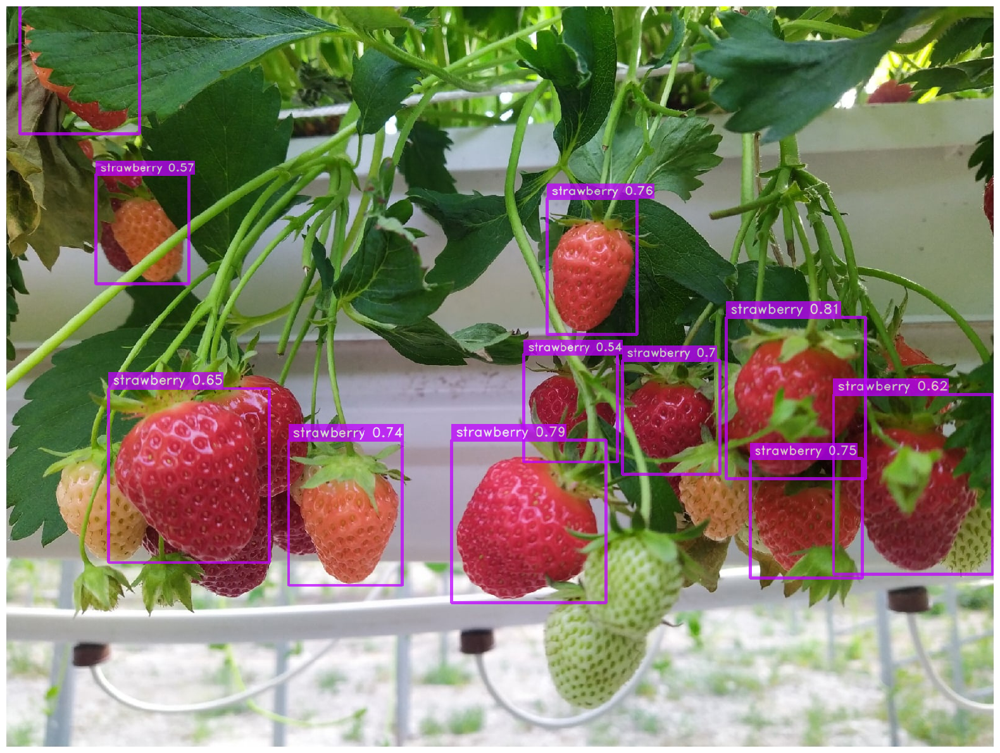

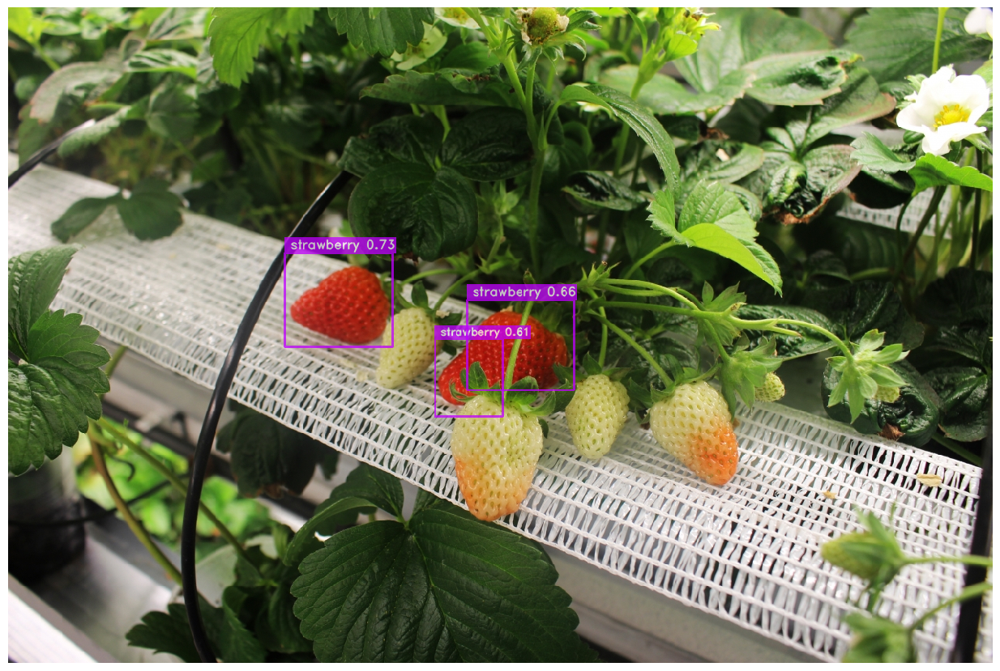

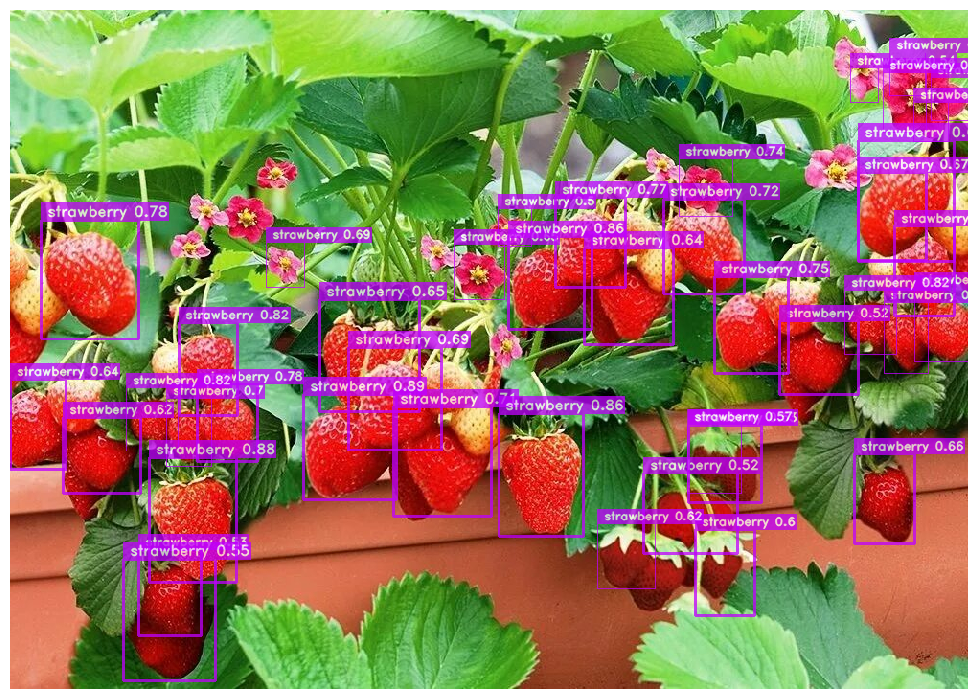

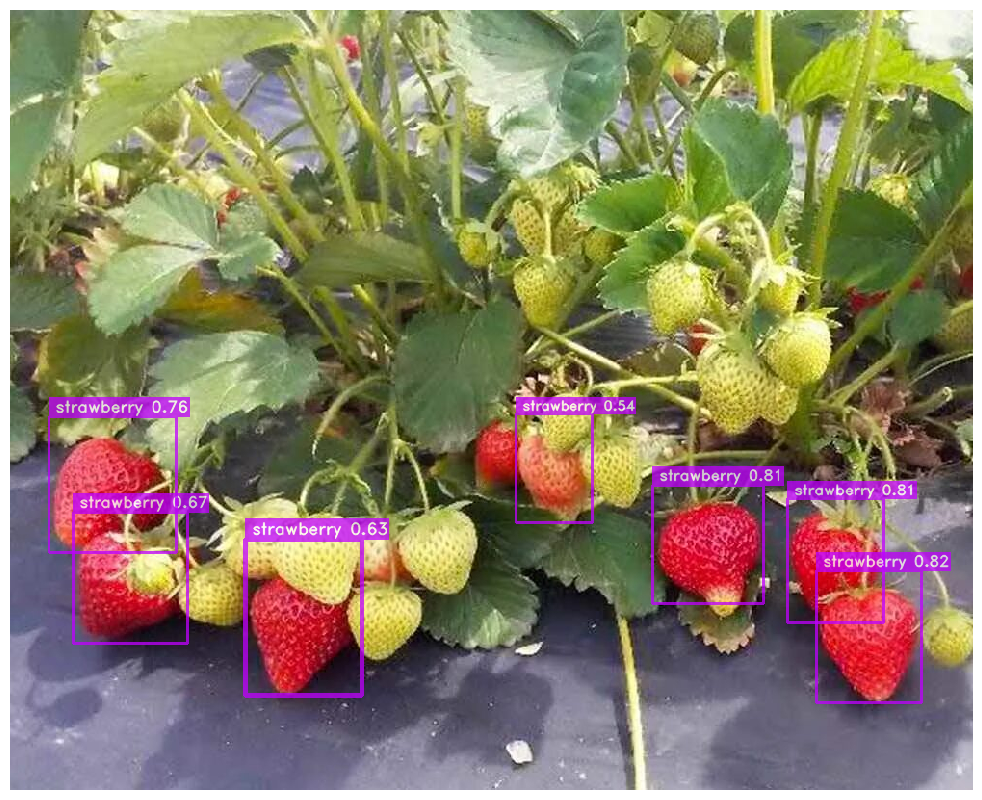

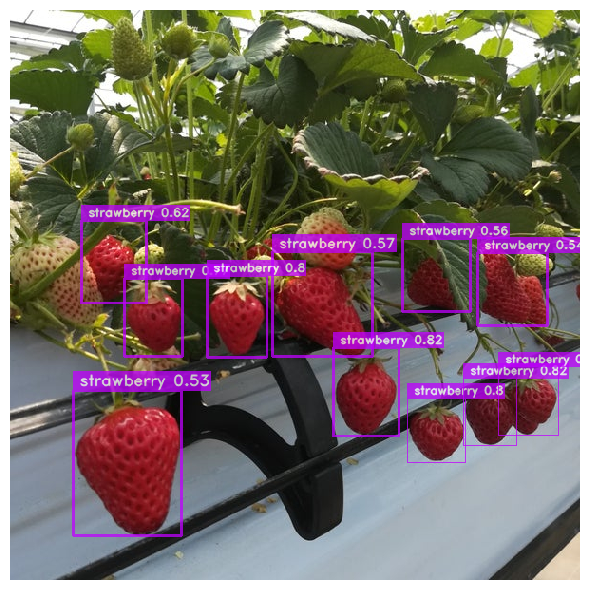

In [ ]:
best_model.predict(tpaths, conf=0.5).show()